<a href="https://colab.research.google.com/github/kindachamma1/ComputerVision2025/blob/Exercise1/Exercise1_Sol.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1: IMAGE PREPROCESSING

---
Kinda Chamma

In [33]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



---


**Task 1**: Load the built-in image 'coffee' of the skimage libraries.


---



<ipython-input-34-dfb522858261>:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC) # visualize image using imshow function
<ipython-input-34-dfb522858261>:5: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


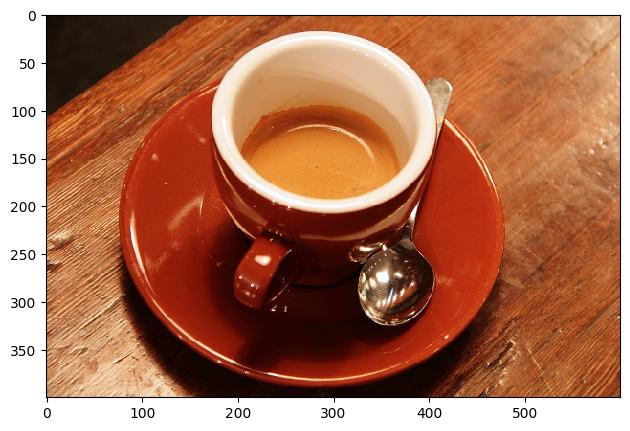

M = 400 columns, N = 600 rows, NC = 3 color channels


In [34]:
import skimage as sk # load skimage libraries
IC = sk.data.coffee() # load a color image from the skimage built-in dataset
# change colormap to visualize image
sk.io.imshow(IC) # visualize image using imshow function
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape)) # Print out image size



---


**Task 2**: Use the skimage function random_noise to add each of the 7 different types of noise available and generate a 4x2 panel figure with the original image and the 7 corrupted versions.


---



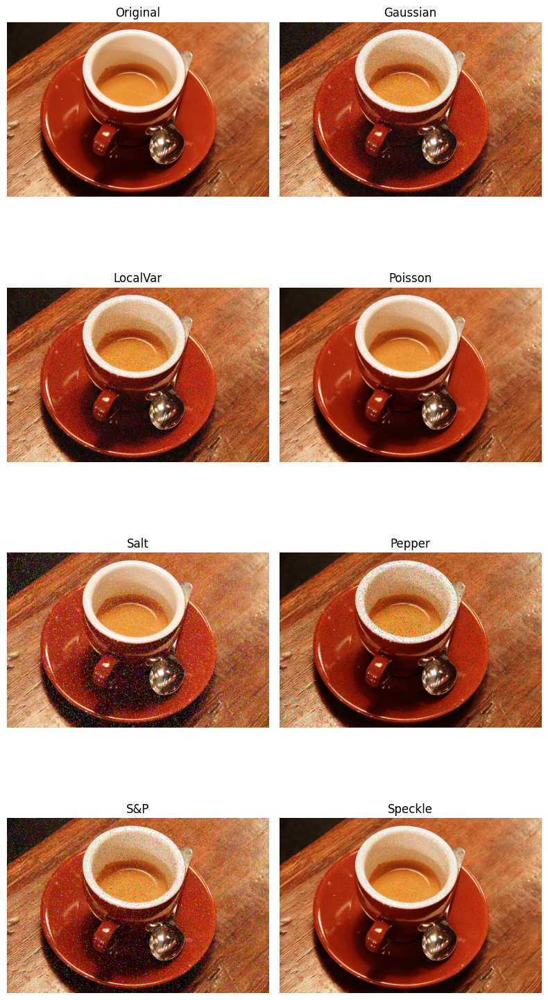

In [35]:
# Libraries
import matplotlib.pyplot as plt
import numpy as np
from skimage import data
from skimage import img_as_ubyte

from skimage import data, img_as_float
from skimage.util import random_noise

# 0. Function to show and compare the images
def plot_comparison_multiple(images, titles, ncols=2):
    """
    Plots a comparison of multiple images in a grid.

    Parameters:
        images (list of 2D arrays): List of images to display.
        titles (list of str): Corresponding titles for the images.
        ncols (int): Number of columns in the grid layout.
    """
    n_images = len(images)
    nrows = (n_images + ncols - 1) // ncols  # Ceiling division for rows

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
    axes = axes.flatten()  # Flatten in case it's a 2D array

    for i in range(len(images)):
        axes[i].imshow(images[i], cmap=plt.cm.gray)
        axes[i].set_title(titles[i])
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(len(images), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# 1. Gaussian distributive additive noise
img = img_as_float(data.coffee())
noisy_image_normal = random_noise(img, 'gaussian')

# 2. Gaussian-distributed additive noise, with specified local variance at each point of image.
noisy_image_gaussian_var = random_noise(img,'localvar')

# 3. Poisson-distributed noise generated from the data.
noisy_image_poisson = random_noise(img, 'poisson')

# 4. ‘salt’ Replaces random pixels with 1.
noisy_image_salt = random_noise(img, 'salt')

# 5. ‘pepper’ Replaces random pixels with 0 (for unsigned images) or 1 (for signed images).
noisy_image_pepper = random_noise(img, 'pepper')

# 6. ‘s&p’ Replaces random pixels with either 1 or low_val, where low_val is 0 for unsigned images or -1 for signed images.
noisy_image_sp = random_noise(img, 's&p')

# 7. ‘speckle’ Multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance.
noisy_image_scpeckle = random_noise(img, 'speckle')

images = [img, noisy_image_normal, noisy_image_gaussian_var , noisy_image_poisson,
          noisy_image_salt, noisy_image_pepper, noisy_image_sp,noisy_image_scpeckle]
titles = ['Original', 'Gaussian', 'LocalVar','Poisson',
          'Salt', 'Pepper', 'S&P', 'Speckle']

plot_comparison_multiple(images, titles)




---


**Task 3**: Select one of the noise types and generate 3 noisy images with different noise intensity levels. Represent the original image along with them in a 2x2 figure.


---



*Noise selected* : Salt

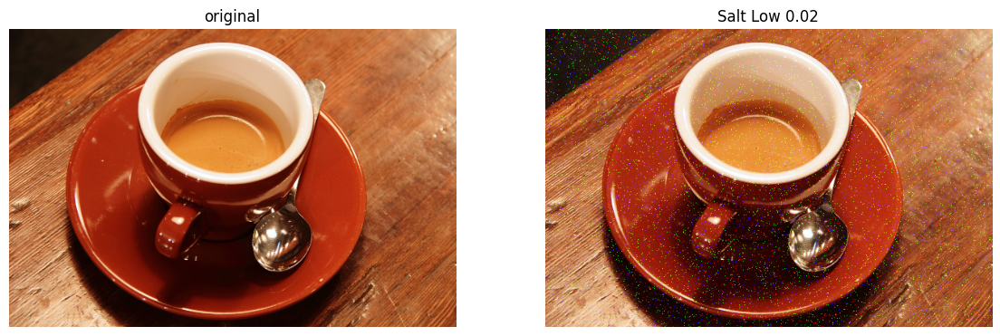

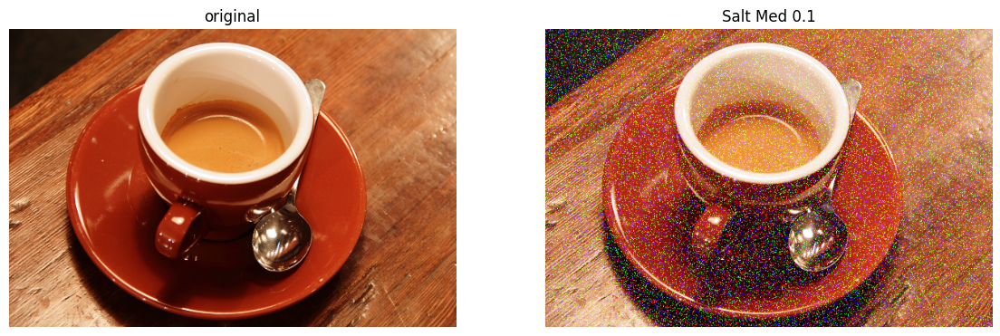

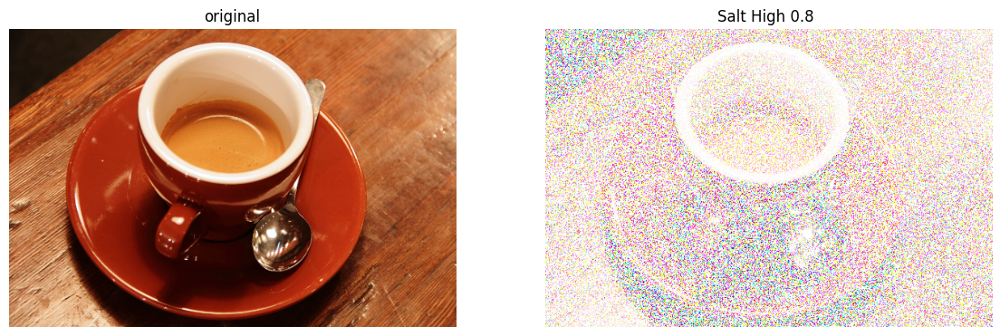

In [36]:
def plot_comparison(original, filtered, filter_name):

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name)
    ax2.axis('off')

# 1. Choice of different values of noise
salt_low = random_noise(img, 'salt', amount=0.02)
plot_comparison(img, salt_low, 'Salt Low 0.02')

salt_med = random_noise(img, 'salt', amount=0.1)
plot_comparison(img, salt_med, 'Salt Med 0.1')

salt_high = random_noise(img, 'salt', amount=0.8) # Obs: at 1 disappears
plot_comparison(img, salt_high, 'Salt High 0.8 ')




---


**Task 4:** The standard deviation for Gaussian kernel affects the behavior of the gaussian filter.  Explore the effect of the parameter sigma when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.


---




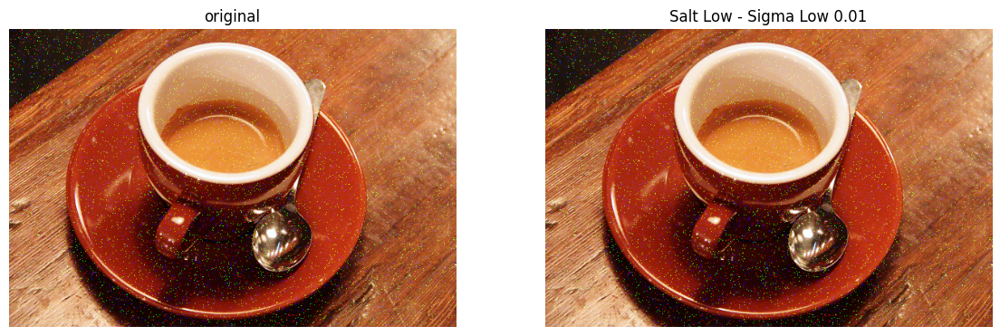

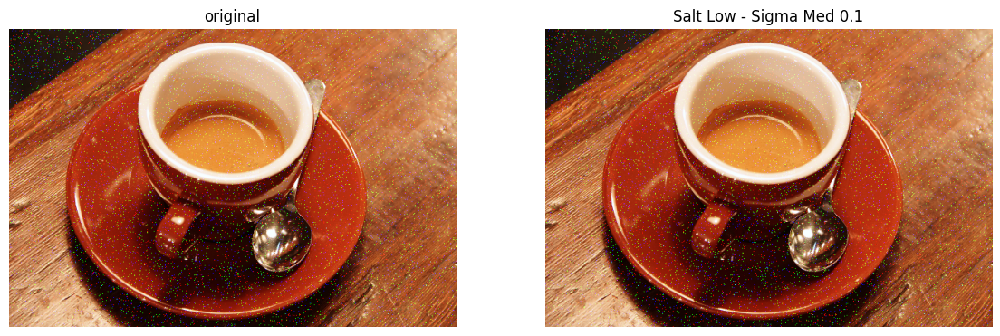

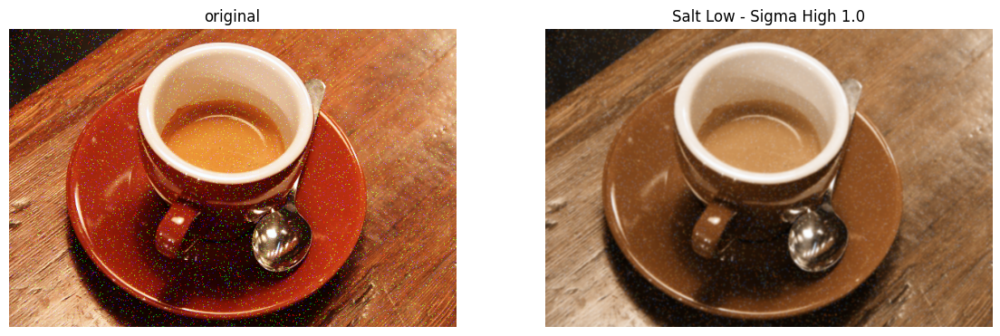

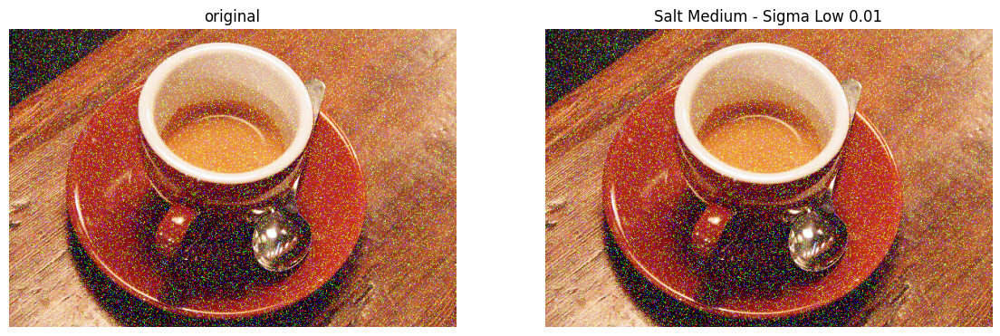

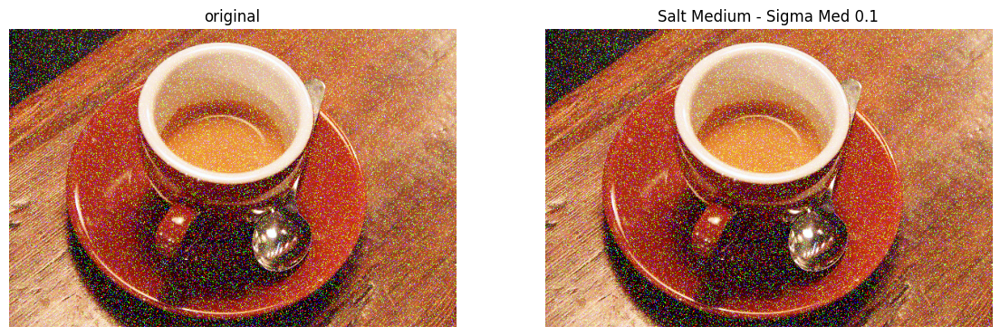

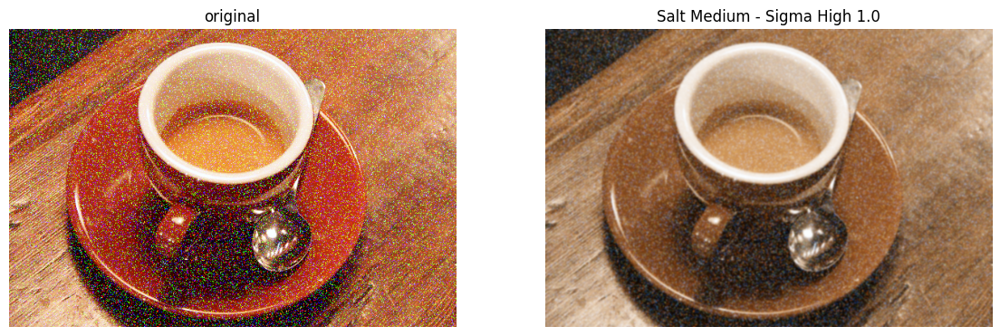

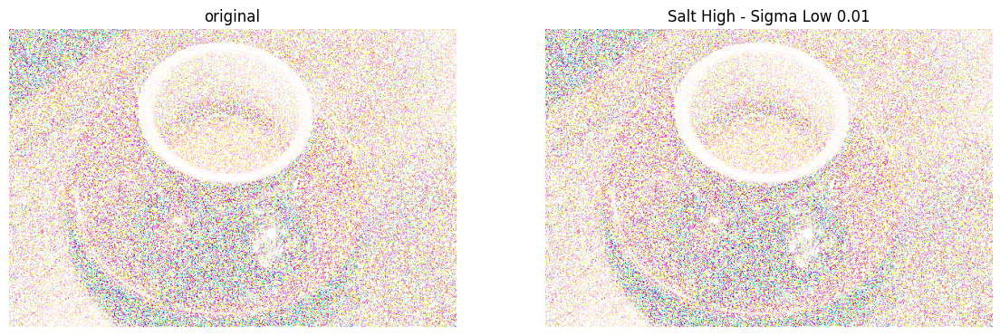

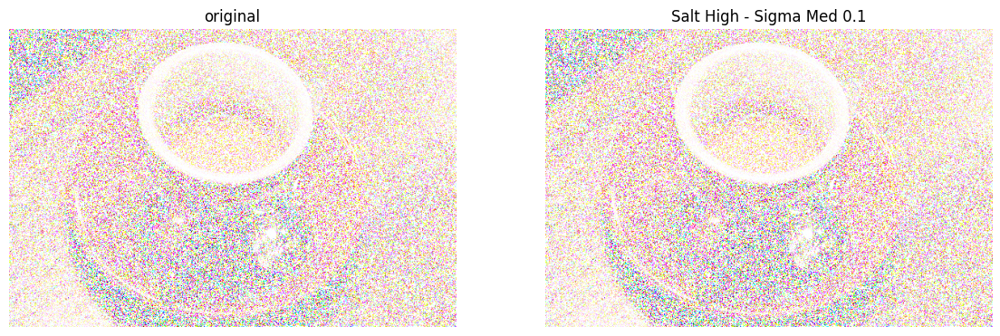

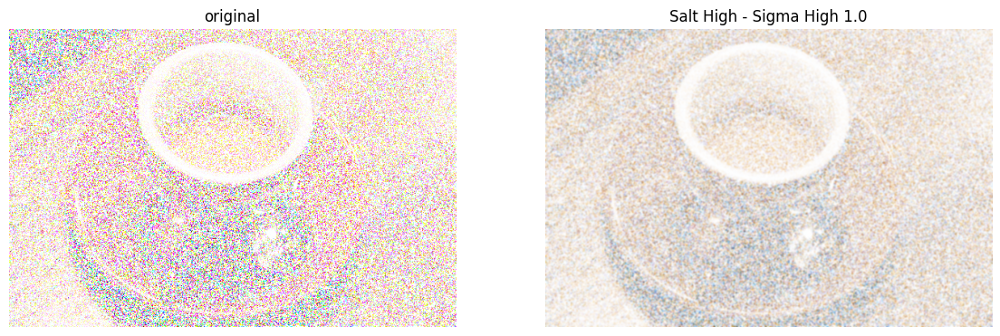

In [37]:
# 1. Salt Low Variation
image_sigma_low = sk.filters.gaussian(salt_low, sigma=0.01)
image_sigma_medium = sk.filters.gaussian(salt_low, sigma=0.1)
image_sigma_high = sk.filters.gaussian(salt_low, sigma=1.0)

plot_comparison(salt_low, image_sigma_low, 'Salt Low - Sigma Low 0.01')
plot_comparison(salt_low, image_sigma_medium, 'Salt Low - Sigma Med 0.1')
plot_comparison(salt_low, image_sigma_high, 'Salt Low - Sigma High 1.0')

# 2. Salt Medium Variation
image_sigma_low_salt_med = sk.filters.gaussian(salt_med, sigma=0.01)
image_sigma_medium_salt_med= sk.filters.gaussian(salt_med, sigma=0.1)
image_sigma_high_salt_med = sk.filters.gaussian(salt_med, sigma=1.0)

plot_comparison(salt_med, image_sigma_low_salt_med, 'Salt Medium - Sigma Low 0.01')
plot_comparison(salt_med, image_sigma_medium_salt_med, 'Salt Medium - Sigma Med 0.1')
plot_comparison(salt_med, image_sigma_high_salt_med, 'Salt Medium - Sigma High 1.0')

# 3. Salt High Variation
image_sigma_low_salt_high = sk.filters.gaussian(salt_high, sigma=0.01)
image_sigma_medium_salt_high = sk.filters.gaussian(salt_high, sigma=0.1)
image_sigma_high_salt_high = sk.filters.gaussian(salt_high, sigma=1.0)

plot_comparison(salt_high, image_sigma_low_salt_high, 'Salt High - Sigma Low 0.01')
plot_comparison(salt_high, image_sigma_medium_salt_high, 'Salt High - Sigma Med 0.1')
plot_comparison(salt_high, image_sigma_high_salt_high, 'Salt High - Sigma High 1.0')



**Explanation &Observation**: I investigated different sigma values for each level of salt noise. In all cases, the highest sigma had the most impact: the image appeared considerably darker. This effect is likely due to salt noise introducing white pixels, and the Gaussian filter averaging pixel intensities. At high sigma values, the smoothing spans a wider area, blending the bright salt pixels with darker regions and thus lowering the overall intensity

---

**Task 5**: Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter. Quantify what is the fraction of the image corresponding to bricks and to edges.

---

<ipython-input-38-bfb9cd37df5b>:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC)
<ipython-input-38-bfb9cd37df5b>:5: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


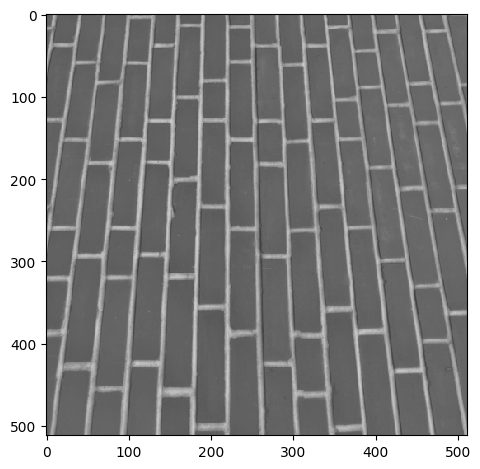

In [38]:
# 1. Import the built-in image 'bricks'
import skimage as sk
IC = sk.data.brick()
sk.io.imshow(IC)
sk.io.show()

In [39]:
IC.shape

(512, 512)

<ipython-input-40-b87e98101575>:19: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  brick_mask = erosion(binary, square(3))  # 3x3 structuring element
<ipython-input-40-b87e98101575>:22: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  dilated = dilation(binary, square(3))


Fraction of bricks: 0.1043
Fraction of edges: 0.1574


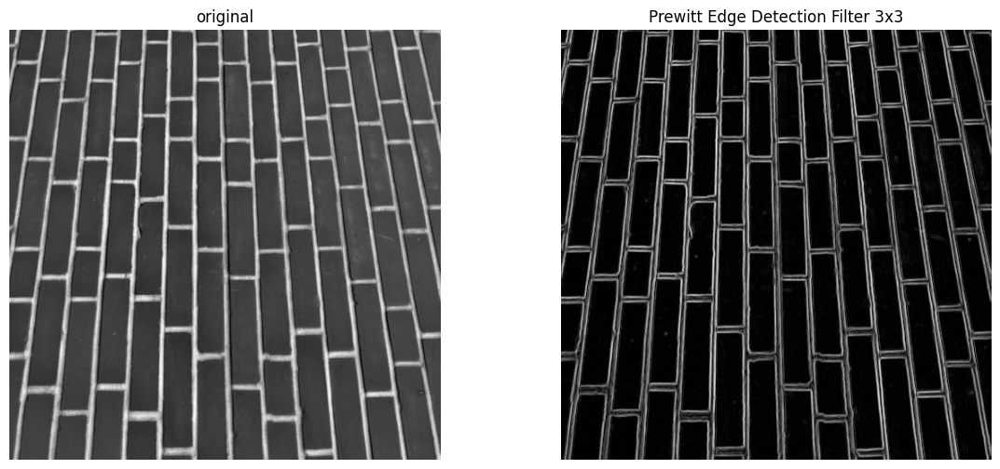

In [40]:
# 2. Detecting edges using the Prewitt edge detection filter
from skimage import data
from skimage.filters import prewitt
from skimage.morphology import erosion, dilation, square


img_f = prewitt(IC)

plot_comparison(IC,img_f, 'Prewitt Edge Detection Filter 3x3')

# 3. Quantify what is the fraction of the image corresponding to bricks = black and to edges = white.

#   3. 1 . Convert image to binary (threshold)
from skimage.filters import threshold_otsu
thresh = threshold_otsu(IC)
binary = IC > thresh

#   3. 2 . Erode the binary image to get the core (brick regions)
brick_mask = erosion(binary, square(3))  # 3x3 structuring element

#   3. 3 . Dilate the binary to get expanded regions
dilated = dilation(binary, square(3))

#   3. 4 . Subtract eroded from dilated to get edge-like regions
edge_mask = dilated ^ brick_mask  # XOR: pixels changed by dilation/erosion

#   3. 5 . Quantify
total_pixels = IC.size
brick_pixels = np.sum(brick_mask)
edge_pixels = np.sum(edge_mask)

fraction_bricks = brick_pixels / total_pixels
fraction_edges = edge_pixels / total_pixels

print(f"Fraction of bricks: {fraction_bricks:.4f}")
print(f"Fraction of edges: {fraction_edges:.4f}")



---


**Task 6**: Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.


---



<ipython-input-43-b6f69bd7ac16>:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(image_grass)
<ipython-input-43-b6f69bd7ac16>:7: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


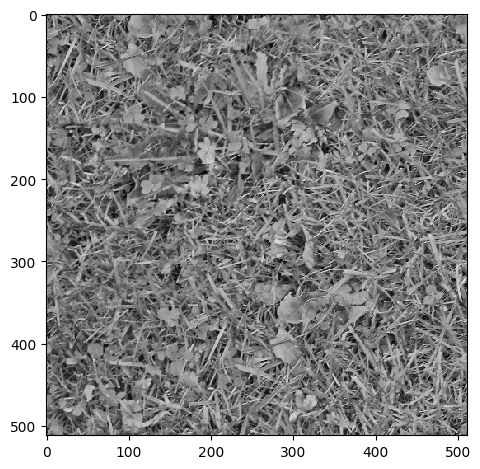

(512, 512)

In [43]:
import numpy as np

# 1. Import the image 'grass'
import skimage as sk
image_grass = sk.data.grass()
sk.io.imshow(image_grass)
sk.io.show()
image_grass.shape

In [47]:
f = np.fft.fft2(image_grass) # Discrete Fourier Transform using FFT algorithm
fshift = np.fft.fftshift(f) # Shift to have zero frequency (origin) at the center of the image
magnitude_spectrum = 20*np.log(np.abs(fshift)) # Logarithmic scale for better visualization of the differences in powert spectrum

# 2. Apply a high pass filter
rows, cols = image_grass.shape
crow,ccol = np.int(rows/2) , np.int(cols/2)
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plot_comparison(image_grass,img_back, 'High-pass filter in the frequency domain')

AttributeError: module 'numpy' has no attribute 'int'.
`np.int` was a deprecated alias for the builtin `int`. To avoid this error in existing code, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations